# 14 - Integration with other datasets

In the previous notebooks we showed that `SCVI` performed best by preserving biological information. 
Here we integrate multiple datasets with our dataset:

- Zhao et al., 2018 
- nEnd with endoid and TSC

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import anndata
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

import scvi
from scvi.model.utils import mde

sc.set_figure_params(dpi_save=300)
sc.settings.figdir = "../reports/figures/14_integration"

Global seed set to 0


## Preparation

### Zhao et al., 2018

In [18]:
genes = pd.read_csv("../data/external/Zhao_et_al_2018/fData.csv", index_col=0)

zhao = sc.read("../data/processed/zhao_et_al_2018.h5ad")
zhao.var_names = genes.loc[zhao.var_names, 'gene_short_name'].values
zhao.var_names_make_unique()
zhao = zhao[zhao.obs.query('Batch not in ["SI5D", "SI12D", "MEF"]').index].copy()

zhao.obs['Cluster'] = zhao.obs.Cluster.astype(str)
zhao.obs['Experiment'] = 'Zhao et al., 2018'
zhao.obs['Stage'] = zhao.obs.Batch
zhao.obs['ct'] = zhao.obs['Batch']

zhao.obs = zhao.obs[['Batch', 'ct', 'Cluster', 'Experiment', 'Stage']]

In [19]:
zhao

AnnData object with n_obs × n_vars = 26673 × 27998
    obs: 'Batch', 'ct', 'Cluster', 'Experiment', 'Stage'
    var: 'features'

### nEnd

In [13]:
nend = sc.read("../data/processed/00_merged.h5ad")
nend.var = nend.var.set_index("_index")

nend_processed = sc.read("../data/processed/normalized_data_TSC_DP.h5ad")
nend = nend[nend_processed.obs_names, nend_processed.var_names].copy()
nend.obs = nend_processed.obs[['Stage', 'Batch', 'seurat_clusters']].copy()
nend = nend[nend.obs.seurat_clusters != 12].copy()

nend.obs['Experiment'] = 'nEnd'
nend.obs['Batch'] = nend.obs.Batch.astype(str)
nend.obs['Cluster'] = [f"nEnd_{c}" for c in nend.obs.seurat_clusters]
nend.obs['Cluster'] = nend.obs['Cluster'].astype(str)
nend.obs['ct'] = nend.obs['Cluster']

nend.obs = nend.obs[['Batch', 'ct', 'Cluster', 'Experiment', 'Stage']]

In [17]:
nend

AnnData object with n_obs × n_vars = 14376 × 32285
    obs: 'Batch', 'ct', 'Cluster', 'Experiment', 'Stage'
    var: 'features'

## Combine datasets

In [25]:
integ = nend.concatenate(zhao, batch_key=None)
integ.layers['counts'] = integ.X

In [26]:
integ

AnnData object with n_obs × n_vars = 41049 × 25943
    obs: 'Batch', 'ct', 'Cluster', 'Experiment', 'Stage'
    var: 'features-0', 'features-1'
    layers: 'counts'

In [27]:
sc.pp.normalize_total(integ)
sc.pp.log1p(integ)
integ.raw = integ

In [28]:
sc.pp.highly_variable_genes(
    integ,
    flavor="seurat_v3",
    n_top_genes=3_000,
    layer="counts",
    batch_key="Batch",
    subset=True
)

In [29]:
sc.tl.pca(integ)

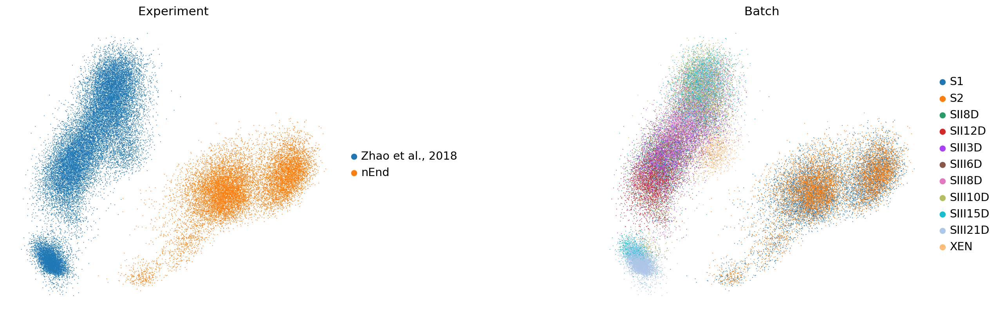

In [30]:
with plt.rc_context({'figure.figsize': [6,6]}):
    sc.pl.pca(integ, color=['Experiment', 'Batch'], frameon=False, wspace=0.6)

## Integration

In [31]:
adata = integ.copy()

In [32]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Batch")

In [33]:
model = scvi.model.SCVI(adata, gene_likelihood="nb", dropout_rate=0.2)
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: nb, latent_distribution: normal
Training status: Not Trained

In [34]:
model.train(use_gpu=True)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 195/195: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [11:11<00:00,  3.44s/it, loss=697, v_num=1]


<AxesSubplot:xlabel='epoch'>

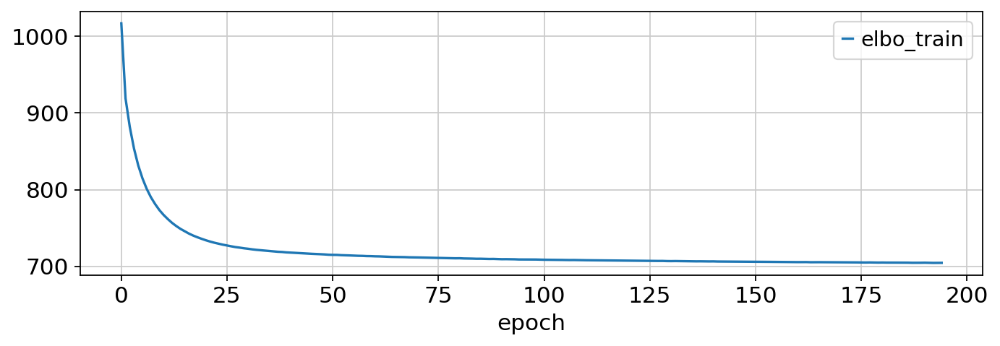

In [35]:
model.history['elbo_train'].plot(figsize=[10,3])

In [36]:
adata.obsm["X_scVI"] = model.get_latent_representation()
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

In [37]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

## Visualization

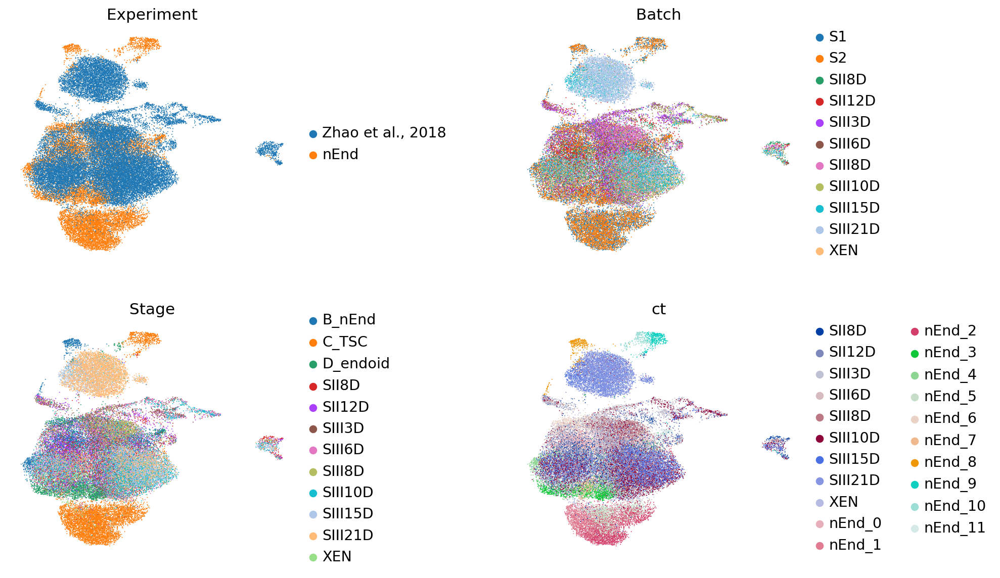

In [38]:
sc.pl.umap(adata, color=['Experiment', 'Batch', 'Stage', 'ct'], frameon=False, wspace=0.6, ncols=2, save='_integration.pdf')

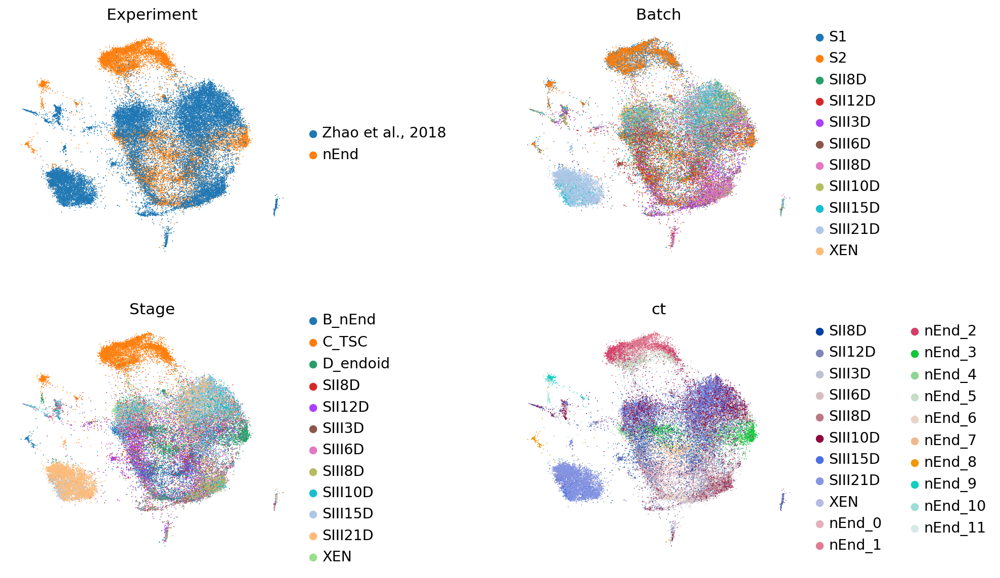

In [39]:
sc.pl.embedding(adata, basis="X_mde", color=['Experiment', 'Batch', 'Stage', 'ct'], frameon=False, wspace=0.6, ncols=2, save='_integration.pdf')

## Trajectory inference

In [40]:
# temporary for the PAGA
adata.obsm['X_pca_old'] = adata.obsm['X_pca']
adata.obsm['X_pca'] = adata.obsm['X_scVI']

In [41]:
sc.tl.draw_graph(adata, n_jobs=10)
sc.tl.paga(adata, groups='ct')

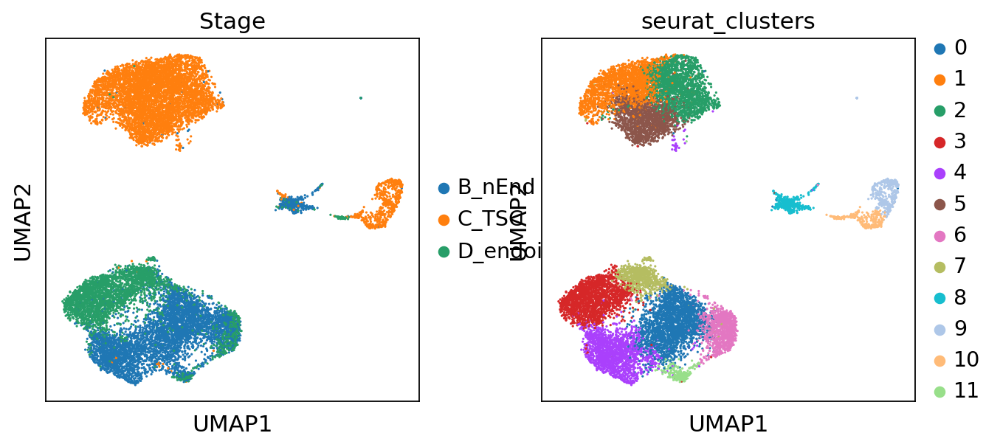

In [60]:
nend_processed.obs.seurat_clusters = nend_processed.obs.seurat_clusters.astype('category')
sc.pl.umap(nend_processed, color=['Stage', 'seurat_clusters'])

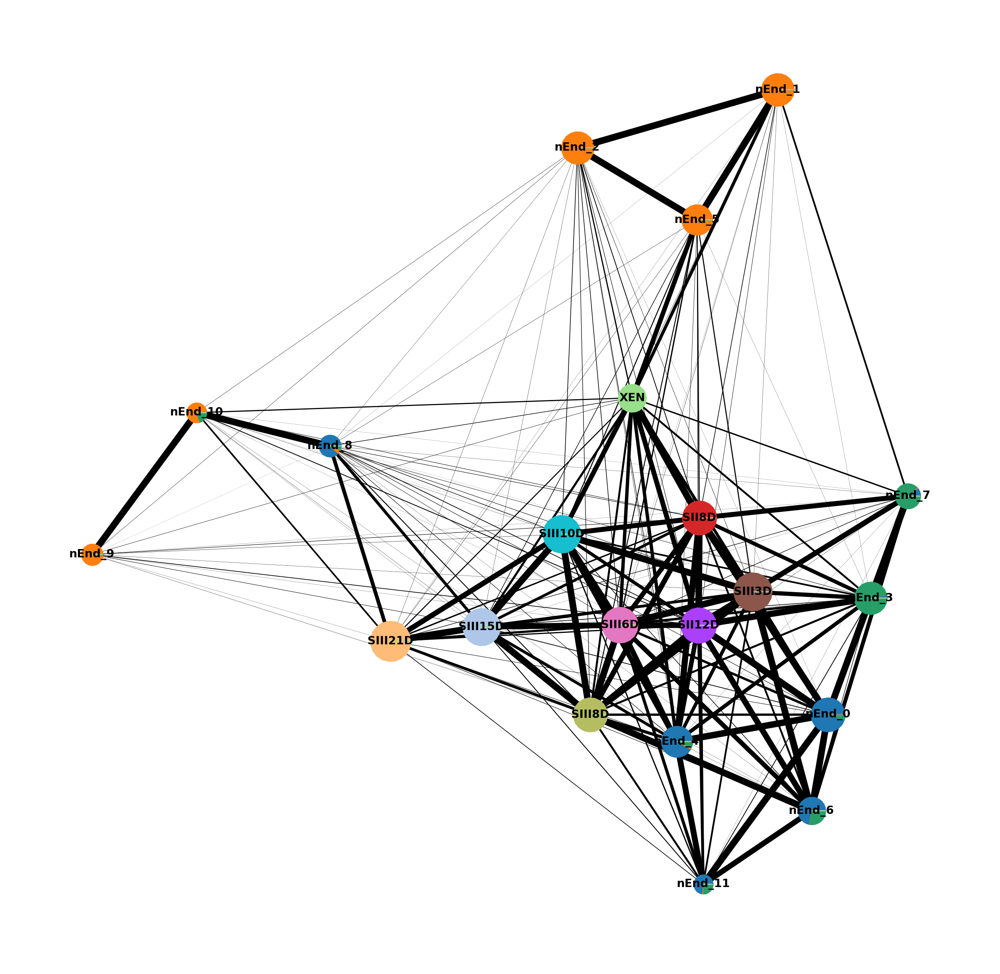

In [42]:
fig = plt.figure(figsize=[20, 20])
ax = fig.add_subplot(111)
sc.pl.paga(adata, color=['Stage'], frameon=False, ax=ax, node_size_scale=10, colors='Stage', save="_stage")

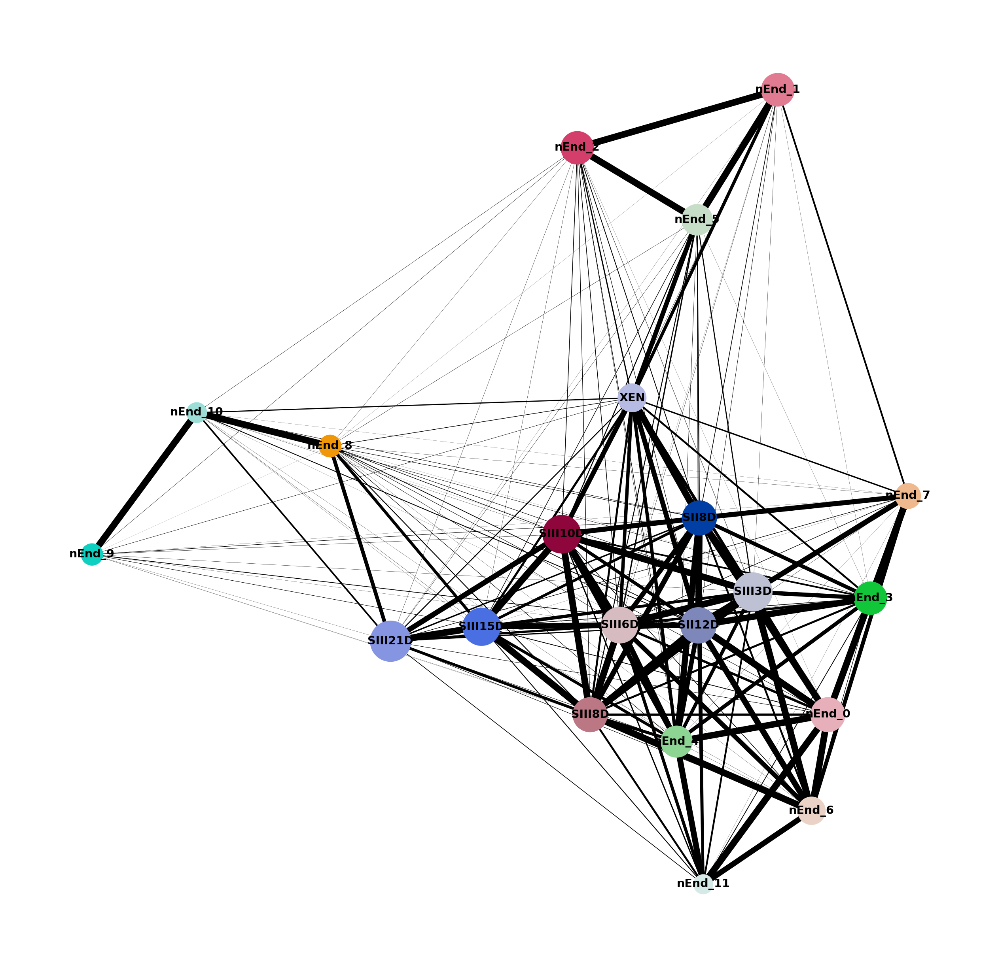

In [43]:
fig = plt.figure(figsize=[20, 20])
ax = fig.add_subplot(111)
sc.pl.paga(adata, color=['ct'], frameon=False, ax=ax, node_size_scale=10, colors='ct', save="_ct")

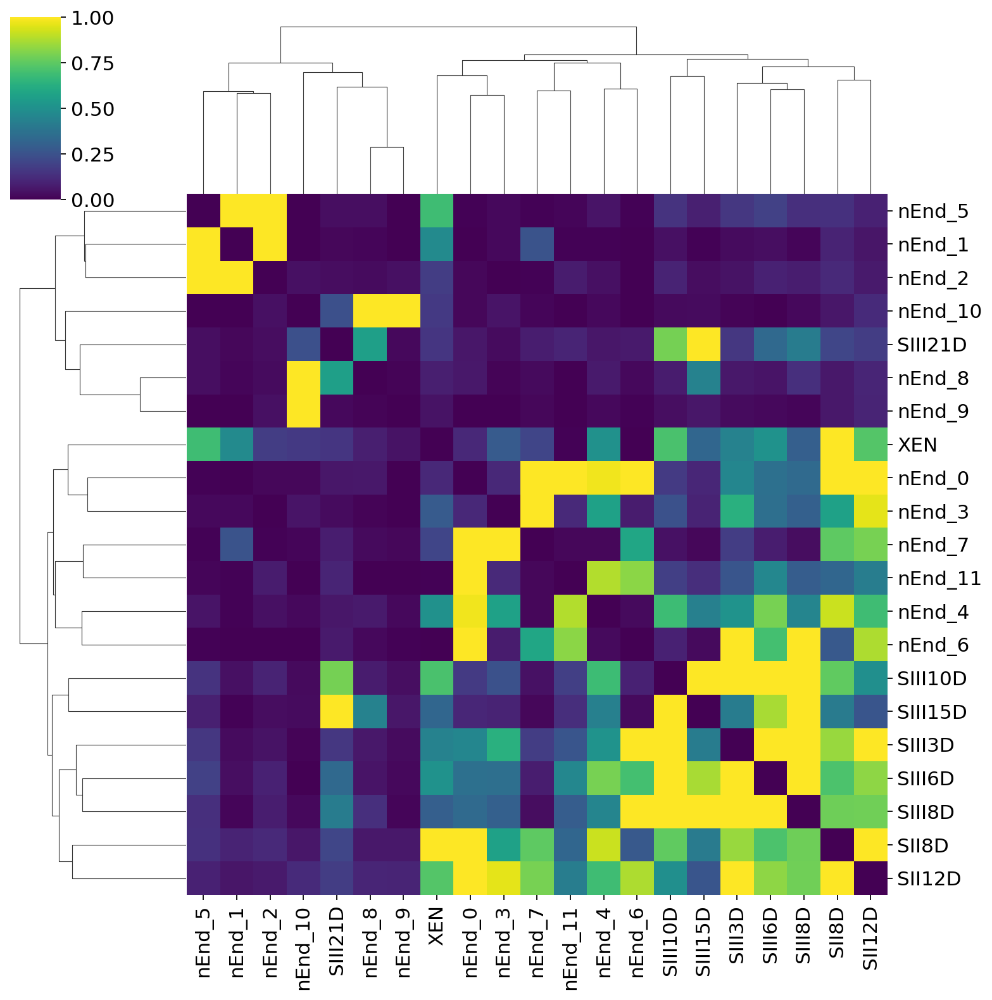

In [45]:
import seaborn as sns

with plt.rc_context({'figure.figsize': [20,20]}):
    sns.clustermap(cmap='viridis', yticklabels=True, xticklabels=True, 
                   data=pd.DataFrame(adata.uns['paga']['connectivities'].A, index=adata.obs.ct.cat.categories, columns=adata.obs.ct.cat.categories))
    plt.savefig('../reports/figures/14_integration/paga_connectivity.pdf')

## Downstream analysis

In [46]:
adata.layers['imputed'] = model.get_normalized_expression()

In [65]:
genes_of_interest = ['Gm4340', 'Tcstv3', 'Zscan4b', 'Zscan4c', 'Zscan4d', 'Zscan4f', 'Gata6', 'Pou5f1', 'Nanog', 'Sparc', 'Thbd']

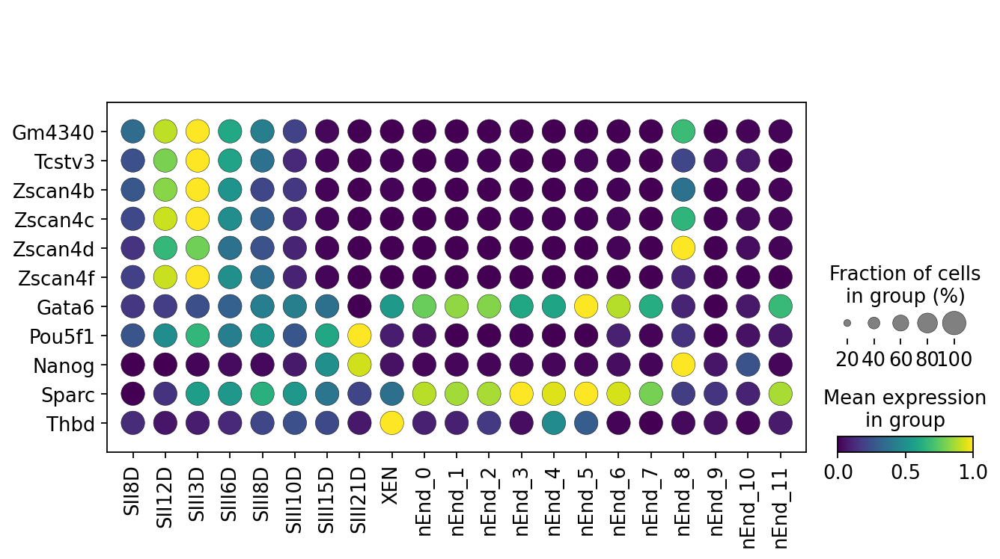

In [66]:
sc.pl.dotplot(model.adata, genes_of_interest, 
              groupby='ct', layer='imputed', use_raw=False, standard_scale='var', swap_axes=True, save='_markers', cmap='viridis')

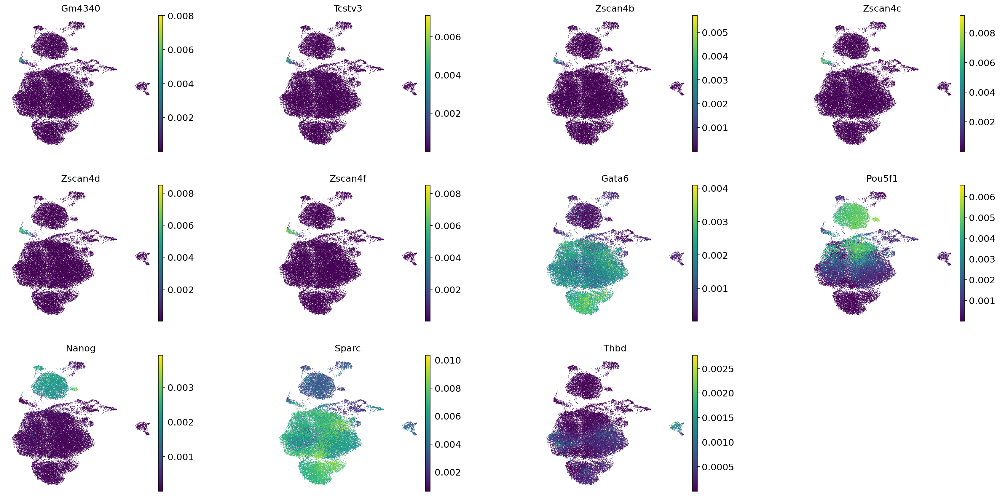

In [67]:
sc.pl.umap(model.adata, color=genes_of_interest, 
           frameon=False, wspace=0.6, ncols=4, layer='imputed', save='_markers')

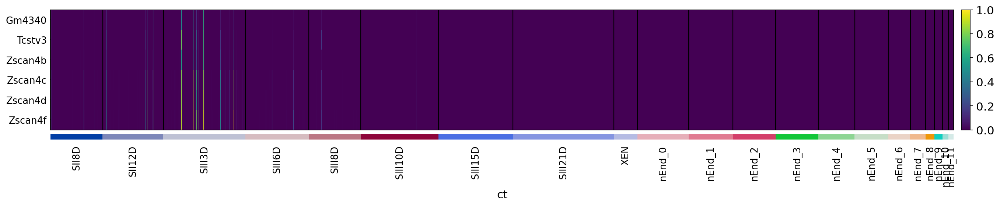

In [53]:
sc.pl.heatmap(model.adata, genes_of_interest, 
              groupby='ct', layer='imputed', use_raw=False, standard_scale='var', swap_axes=True, figsize=[20, 3])

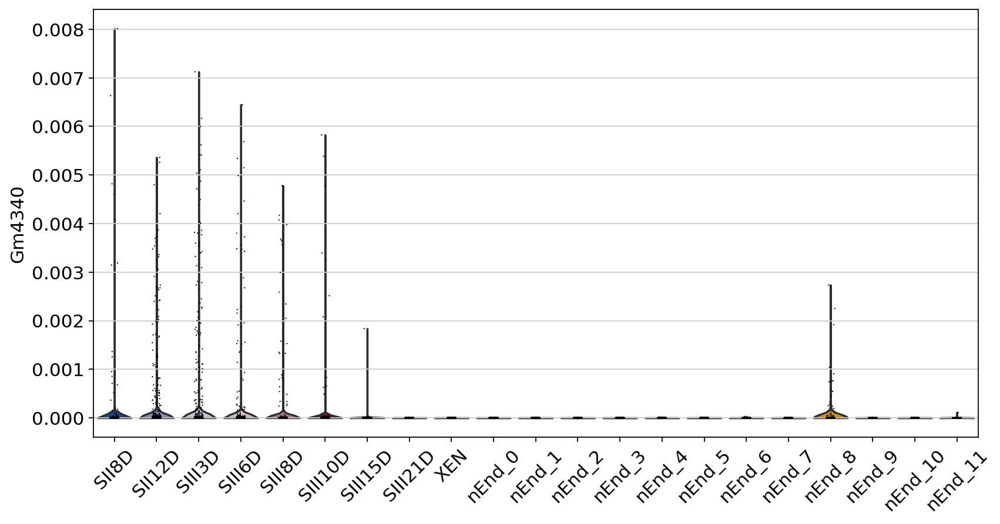

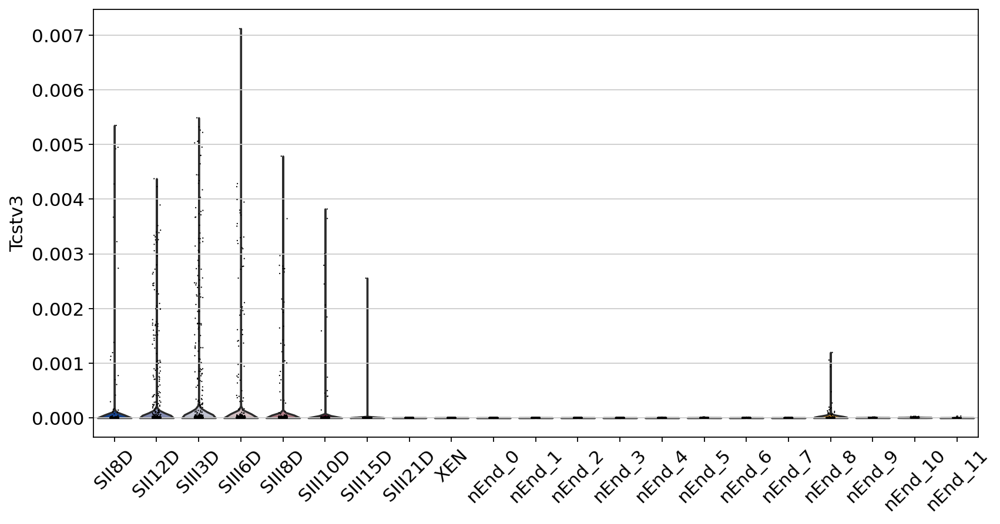

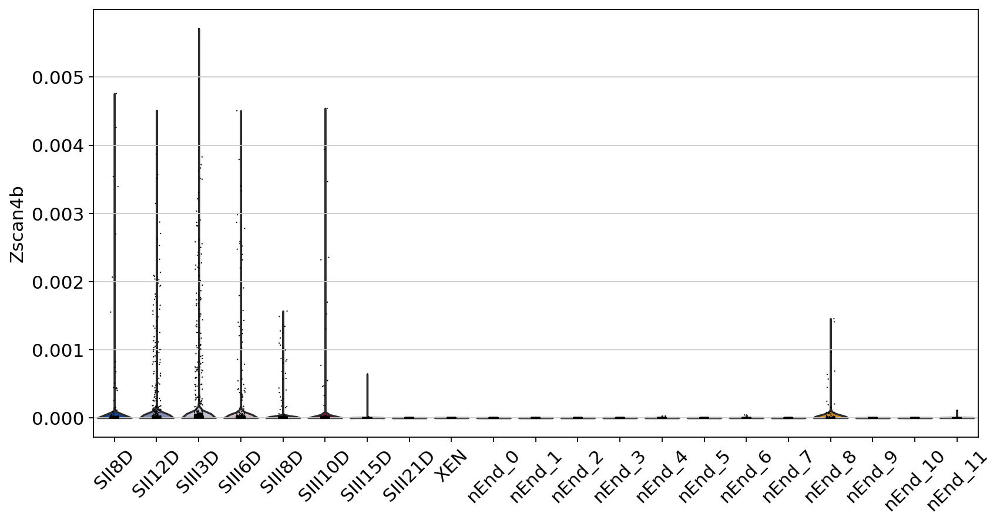

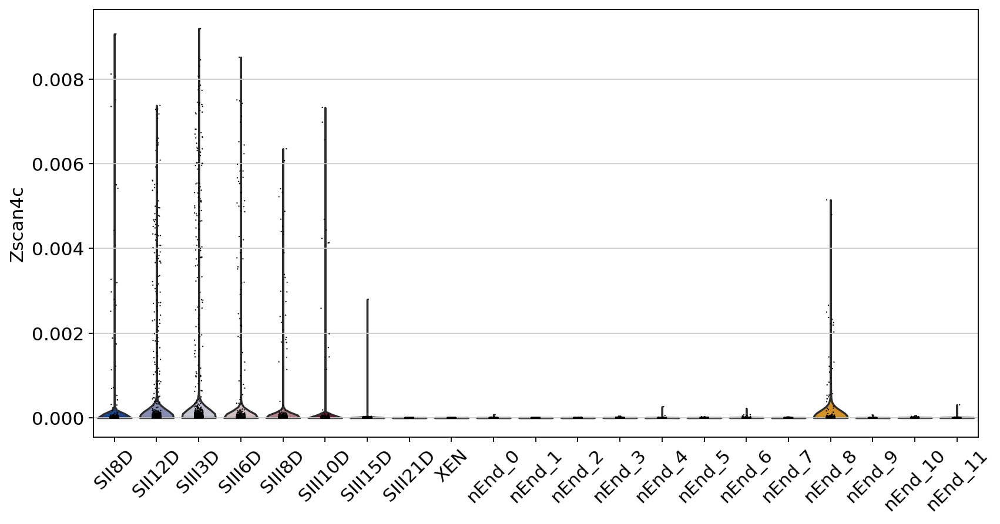

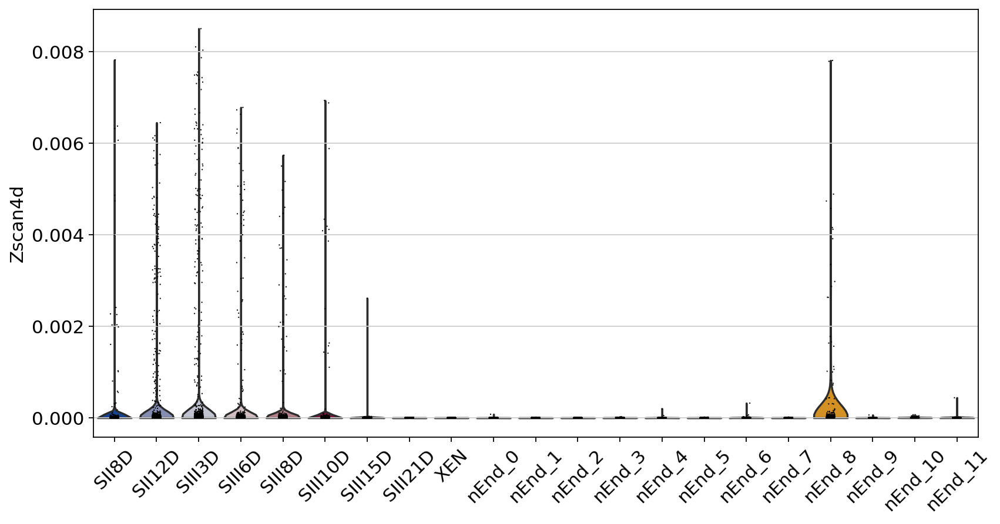

...

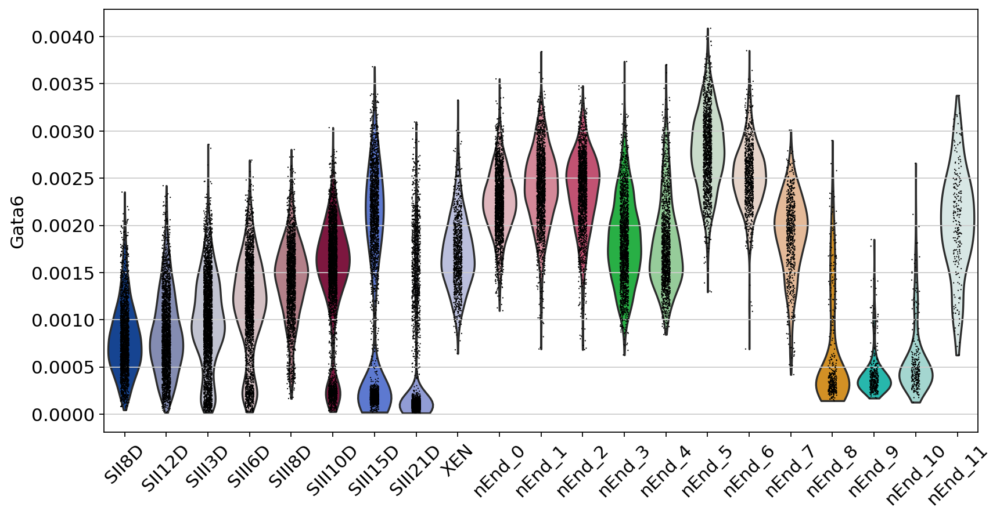

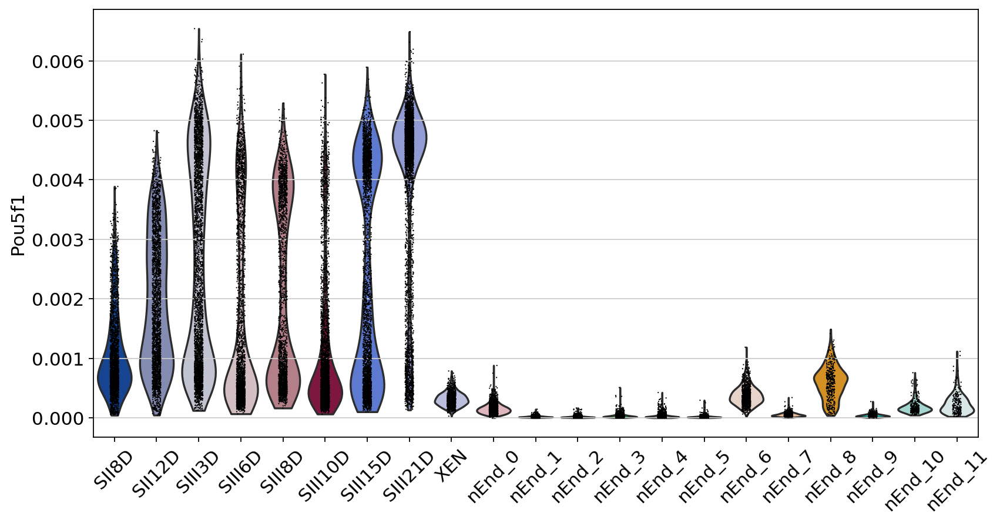

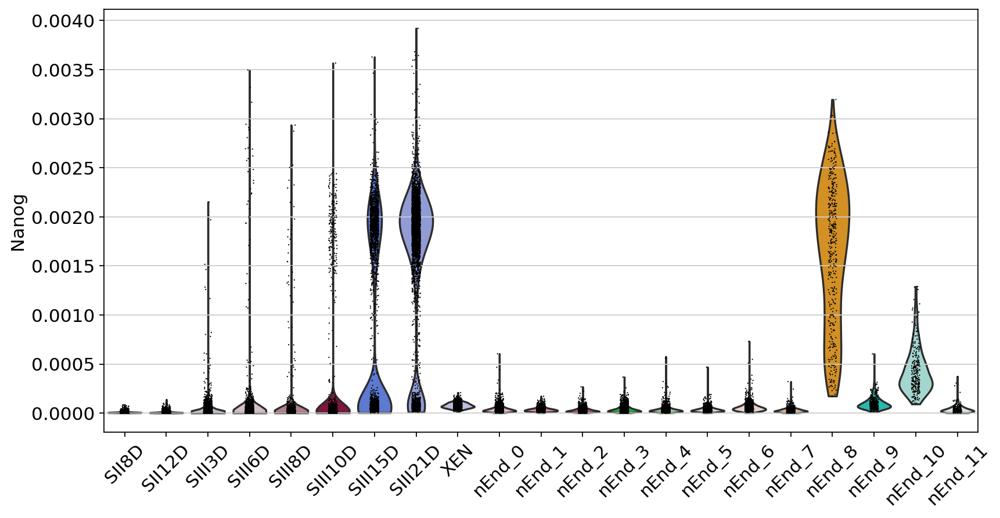

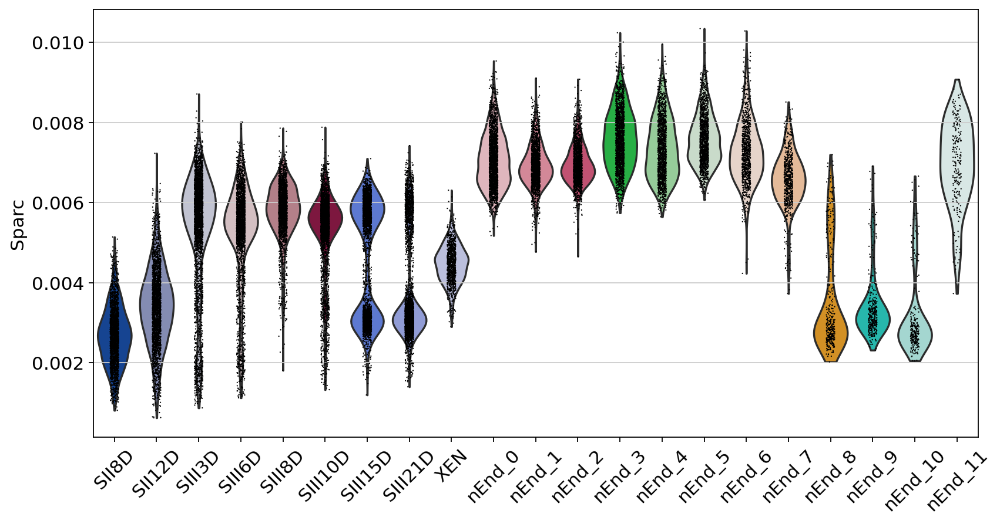

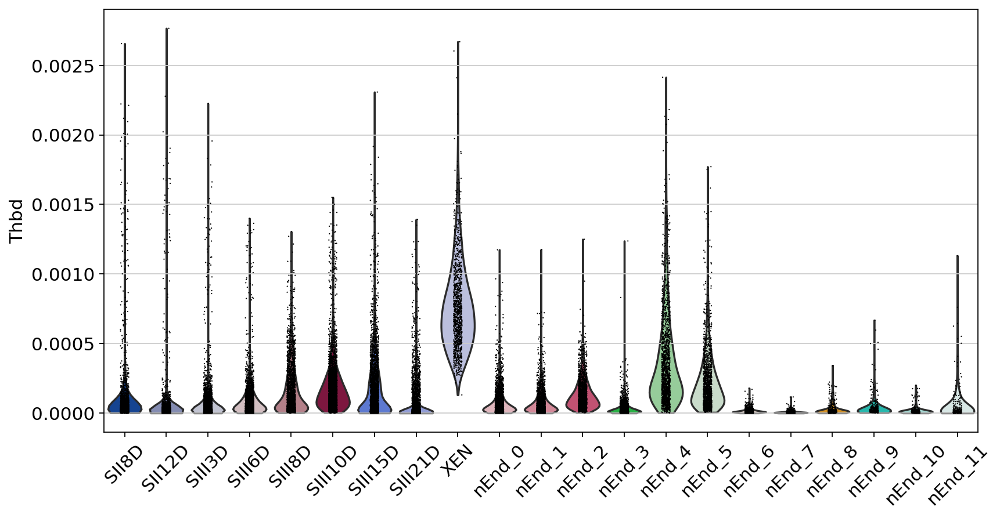

In [68]:
with plt.rc_context({'figure.figsize': [10,6]}):
    for g in genes_of_interest:
        sc.pl.violin(model.adata, g, groupby='ct', layer='imputed', use_raw=False, rotation=45)

## Save model

In [56]:
model.save("../results/14_integration", overwrite=True, save_anndata=True)

In [70]:
!jupyter nbconvert --to html 14_integration.ipynb --output-dir="../reports"

[NbConvertApp] Converting notebook 14_integration.ipynb to html
[NbConvertApp] Writing 10782560 bytes to ../reports/14_integration.html
